In [1]:
from google.colab import files
upload = files.upload()

Saving climate_change_indicators.csv to climate_change_indicators.csv


In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score

df = pd.read_csv("climate_change_indicators.csv")
df = df.drop("ISO3", axis=1)
df = df.drop("CTS_Code", axis=1)
df = df.dropna(axis=0)

countries = df["Country"]

new_df=(df.iloc[:,8:].rolling(3,axis=1).mean())
# new_df
new_df=new_df.dropna(axis=1)
# new_df
tem_dataset=df.join(new_df, how='left', rsuffix='Mean')
# tem_dataset
pre_dataset=tem_dataset.drop(tem_dataset.columns[:8], axis=1)
pre_dataset= pre_dataset.reindex(sorted(pre_dataset.columns), axis=1)
#pre_dataset

X = pre_dataset.iloc[:, 2:-8]
# X
y = df["F2022"]
# y



In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_regressor = RandomForestRegressor(n_estimators=150, random_state=42)
rf_regressor.fit(X_train.values, y_train.values)

y_pred = rf_regressor.predict(X_test.values)
y_pred


array([2.28085333, 1.97468   , 1.41474   , 1.17746667, 2.38142   ,
       1.33079333, 1.21248667, 2.17730667, 0.97496667, 1.09099333,
       1.20478667, 1.98302   , 0.70773333, 1.19798   , 1.53951333,
       1.52418   , 2.06654667, 2.44426   , 1.10851333, 1.50184   ,
       0.91607333, 0.85142   , 0.95610667, 1.06962   , 0.86761333,
       0.87956   , 1.97604667, 0.69432667, 1.00718   , 2.05808   ,
       2.18218   , 0.96592   ])

Mean Squared Error: 0.052180668848611
R-squared: 0.8504287048023683
Accuracy: 85.04287065641417


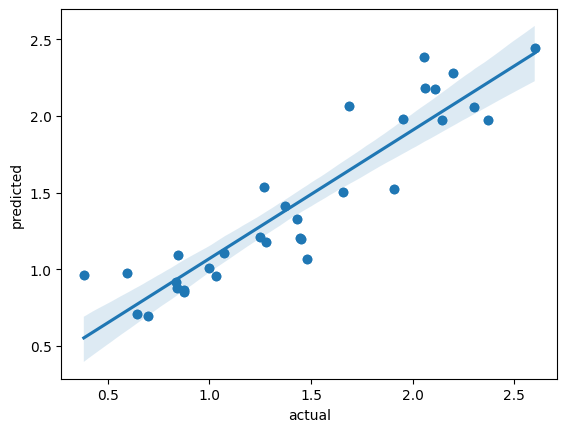

In [13]:

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
accuracy = explained_variance_score(y_test, y_pred) * 100

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
print(f'Accuracy: {accuracy}')
list1 = list(zip(y_test,y_pred))
plotdf = pd.DataFrame(list1,columns = ["actual","predicted"])
plt.scatter(y_test,y_pred)
sns.regplot(x = "actual",y="predicted",data=plotdf)
plt.show()

Since our mse is lower than 1 , we can say that our model is accurate enough to predict the future values.

In [14]:
new_X = pre_dataset.iloc[:,10:] # to keep the feature count constant we shifted the column count by 4 years+4 years mean data=8data+we are leaving 2 data=10 data to the right
predicted2026 = rf_regressor.predict(new_X)
df["F2026"] = predicted2026


df = df.drop(["CTS_Name"], axis=1)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


In [15]:
df = df.drop(["Indicator"],axis=1)

In [16]:
df = df.drop(["Source"],axis = 1)
df = df.drop(["CTS_Full_Descriptor"],axis=1)
df = df.drop(["ISO2"],axis=1)
df = df.drop(["ObjectId"],axis=1)
df = df.drop(["Unit"],axis = 1)

df.head(10)

,Country,F1961,F1962,F1963,F1964,F1965,F1966,F1967,F1968,F1969,...,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,F2026
0,"Afghanistan, Islamic Rep. of",-0.113,-0.164,0.847,-0.764,-0.244,0.226,-0.371,-0.423,-0.539,...,0.456,1.093,1.555,1.540,1.544,0.910,0.498,1.327,2.012,1.600867
1,Albania,0.627,0.326,0.075,-0.166,-0.388,0.559,-0.074,0.081,-0.013,...,1.198,1.569,1.464,1.121,2.028,1.675,1.498,1.536,1.518,1.735613
2,Algeria,0.164,0.114,0.077,0.250,-0.100,0.433,-0.026,-0.067,0.291,...,1.690,1.121,1.757,1.512,1.210,1.115,1.926,2.330,1.688,1.982213
4,"Andorra, Principality of",0.736,0.112,-0.752,0.308,-0.490,0.415,0.637,0.018,-0.137,...,1.946,1.690,1.990,1.925,1.919,1.964,2.562,1.533,3.243,2.174933
5,Angola,0.041,-0.152,-0.190,-0.229,-0.196,0.175,-0.081,-0.193,0.188,...,0.828,1.331,1.609,0.870,1.395,1.752,1.162,1.553,1.212,1.361553
6,Anguilla,0.086,-0.024,0.234,0.189,-0.365,-0.001,-0.257,-0.200,0.317,...,0.814,1.051,1.125,0.960,0.664,0.843,1.224,0.893,0.839,1.130593
8,Argentina,0.122,-0.046,0.162,-0.343,0.090,-0.163,0.000,0.472,0.292,...,0.951,0.957,0.488,1.095,0.878,0.760,1.123,1.031,0.643,0.797527
11,Australia,0.157,0.126,-0.096,-0.012,0.140,-0.230,-0.093,-0.203,0.103,...,1.198,1.087,1.172,1.141,1.129,1.422,1.416,0.629,0.754,1.000627
12,Austria,1.031,-0.621,-0.727,-0.371,-0.883,0.602,0.676,0.211,-0.126,...,2.409,2.167,2.096,1.741,2.524,2.370,2.315,1.395,2.498,2.225493
14,"Bahamas, The",0.073,-0.062,-0.097,0.192,0.054,-0.172,-0.146,-0.324,-0.065,...,0.883,1.114,1.042,1.331,1.023,1.443,1.611,0.879,1.480,1.161513


In [8]:
new_df = new_df.T

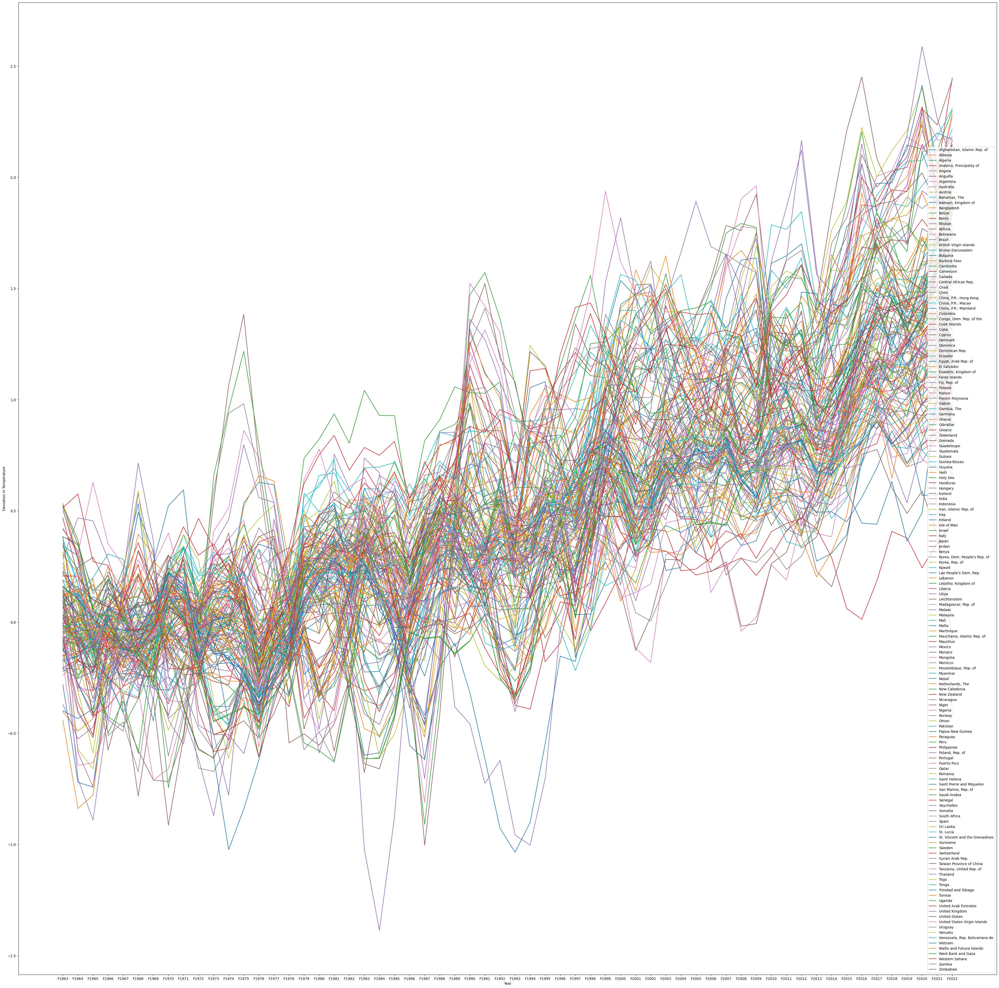

In [9]:
plt.figure(figsize=(50,50))
plt.plot(new_df)
plt.xlabel('Year')
plt.ylabel('Deviation in Temperature')
plt.legend(countries)
plt.show()